In [30]:
import ast
import json
import re
import string
import time
import sys
import datetime
import contextlib
import os
from datetime import timedelta

import requests
import ssl
import tempfile
from io import StringIO

import pandas as pd
import numpy as np
import glob
from pathlib import Path


import datetime
import seaborn as sns
# from minepy import MINE
# from heapq import merge

import matplotlib.pyplot as plt

import seaborn as sns
from statsmodels.tsa.seasonal import STL, seasonal_decompose
# from meteostat import Point, Daily, Hourly
from dateutil.relativedelta import relativedelta

from dateutil import relativedelta
from sklearn.preprocessing import PolynomialFeatures


from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVC

In [31]:
fileAll="Z:\Dropbox (PowerMarketsUR)\Moscow Office\ERCOT\MCC_INFLUENCE\spp\model\dataset/CSWS.VOLT.0124_final.csv"
data = pd.read_csv(fileAll, low_memory=False)
data['Data'] = pd.to_datetime(data['Data'], format='%Y-%m-%d')
data

,Year,Month,Day,Hour,Wind,Coal,Load,NaturalGas,PriceGaz,temp,...,wdir,wspd,pres,Price,Peak,Data,temp_mean,wspd_mean,pres_mean,Season
0,2022,4,1,0,11261.300,9906.600,27364.785,4318.000,5.43,11.1,...,310.0,9.4,1012.6,1.1016,0.0,2022-04-01 00:00:00,17.0,23.0,1012.0,Spring
1,2022,4,1,1,12656.000,9607.008,27144.399,2899.783,5.43,7.8,...,40.0,5.4,1012.8,1.9007,0.0,2022-04-01 01:00:00,17.0,23.0,1012.0,Spring
2,2022,4,1,2,13150.708,9300.617,27117.422,2830.575,5.43,7.2,...,0.0,0.0,1013.4,3.8994,0.0,2022-04-01 02:00:00,17.0,23.0,1012.0,Spring
3,2022,4,1,3,13862.425,8811.367,27297.655,2771.042,5.43,3.9,...,0.0,0.0,1014.1,2.9296,0.0,2022-04-01 03:00:00,17.0,23.0,1012.0,Spring
4,2022,4,1,4,14428.500,9045.167,27823.858,2950.642,5.43,3.3,...,0.0,0.0,1014.1,2.3903,0.0,2022-04-01 04:00:00,17.0,23.0,1012.0,Spring
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,2022,11,7,20,18579.892,3235.842,29452.850,6788.167,4.62,20.6,...,100.0,14.8,1022.6,12.0815,1.0,2022-11-07 20:00:00,16.0,19.0,1014.0,Autumn
5283,2022,11,7,21,19330.683,3018.142,28559.588,5713.508,4.62,20.0,...,90.0,18.4,1022.6,20.8286,1.0,2022-11-07 21:00:00,16.0,19.0,1014.0,Autumn
5284,2022,11,7,22,19511.817,2811.475,27382.076,4851.733,4.62,20.0,...,90.0,14.8,1022.5,23.8164,0.0,2022-11-07 22:00:00,16.0,19.0,1014.0,Autumn
5285,2022,11,7,23,19282.625,2681.342,26143.921,4235.075,4.62,20.0,...,90.0,13.0,1023.0,18.5490,0.0,2022-11-07 23:00:00,16.0,19.0,1014.0,Autumn


<AxesSubplot:>

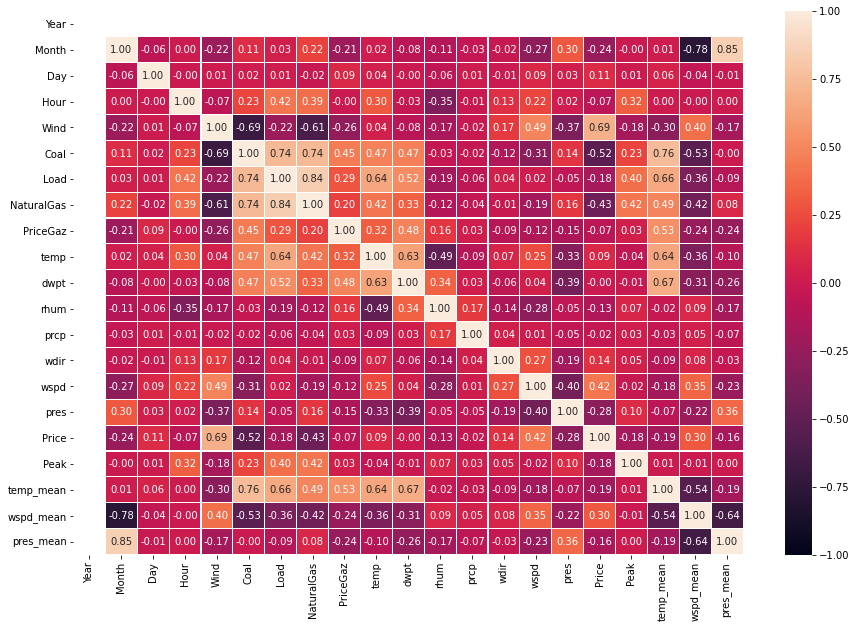

In [32]:
plt.rcParams['figure.figsize'] = (15,10)
sns.heatmap(data[data.columns].corr(), vmin=-1, vmax=1, annot=True, fmt=".2f", linewidths=0.1)

In [33]:
corr = data[data.columns].corr()
corr["Price"].abs().sort_values()


dwpt          0.003318
prcp          0.023651
Hour          0.070829
PriceGaz      0.073049
temp          0.086639
Day           0.106496
rhum          0.127041
wdir          0.139705
pres_mean     0.162069
Peak          0.177528
Load          0.177997
temp_mean     0.187217
Month         0.236789
pres          0.283294
wspd_mean     0.301233
wspd          0.423739
NaturalGas    0.434121
Coal          0.516887
Wind          0.694899
Price         1.000000
Year               NaN
Name: Price, dtype: float64

## Парное сравнение признаков

In [35]:
fileAll="Z:\Dropbox (PowerMarketsUR)\Moscow Office\ERCOT\MCC_INFLUENCE\spp\model\dataset/CSWS.VOLT.0124_final.csv"
data = pd.read_csv(fileAll, low_memory=False)
data['Data'] = pd.to_datetime(data['Data'], format='%Y-%m-%d')
data.sort_values(by=['Data'], ascending=True, inplace=True)

Data = data[["Data"]].copy()
price = data[["Price"]].copy()
params = data[["Wind", "Coal","Load","NaturalGas","PriceGaz","temp_mean"]].copy()

trans = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
paramsTransform = trans.fit_transform(params)
paramsPoly = pd.DataFrame(data=paramsTransform, columns=trans.get_feature_names(params.columns))
paramsPoly

c:\study\venv\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,Wind,Coal,Load,NaturalGas,PriceGaz,temp_mean,Wind Coal,Wind Load,Wind NaturalGas,Wind PriceGaz,...,Coal Load,Coal NaturalGas,Coal PriceGaz,Coal temp_mean,Load NaturalGas,Load PriceGaz,Load temp_mean,NaturalGas PriceGaz,NaturalGas temp_mean,PriceGaz temp_mean
0,11261.300,9906.600,27364.785,4318.000,5.43,17.0,1.115612e+08,3.081631e+08,4.862629e+07,61148.85900,...,2.710920e+08,4.277670e+07,53792.83800,168412.200,1.181611e+08,148590.78255,465201.345,23446.74000,73406.000,92.31
1,12656.000,9607.008,27144.399,2899.783,5.43,17.0,1.215863e+08,3.435395e+08,3.669965e+07,68722.08000,...,2.607765e+08,2.785824e+07,52166.05344,163319.136,7.871287e+07,147394.08657,461454.783,15745.82169,49296.311,92.31
2,13150.708,9300.617,27117.422,2830.575,5.43,17.0,1.223097e+08,3.566133e+08,3.722407e+07,71408.34444,...,2.522088e+08,2.632609e+07,50502.35031,158110.489,7.675790e+07,147247.60146,460996.174,15370.02225,48119.775,92.31
3,13862.425,8811.367,27297.655,2771.042,5.43,17.0,1.221469e+08,3.784117e+08,3.841336e+07,75272.96775,...,2.405297e+08,2.441667e+07,47845.72281,149793.239,7.564295e+07,148226.26665,464060.135,15046.75806,47107.714,92.31
4,14428.500,9045.167,27823.858,2950.642,5.43,17.0,1.305082e+08,4.014565e+08,4.257334e+07,78346.75500,...,2.516714e+08,2.668905e+07,49115.25681,153767.839,8.209824e+07,151083.54894,473005.586,16021.98606,50160.914,92.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,18579.892,3235.842,29452.850,6788.167,4.62,16.0,6.012159e+07,5.472308e+08,1.261234e+08,85839.10104,...,9.530477e+07,2.196544e+07,14949.59004,51773.472,1.999309e+08,136072.16700,471245.600,31361.33154,108610.672,73.92
5283,19330.683,3018.142,28559.588,5713.508,4.62,16.0,5.834275e+07,5.520763e+08,1.104460e+08,89307.75546,...,8.619689e+07,1.724418e+07,13943.81604,48290.272,1.631754e+08,131945.29656,456953.408,26396.40696,91416.128,73.92
5284,19511.817,2811.475,27382.076,4851.733,4.62,16.0,5.485699e+07,5.342741e+08,9.466613e+07,90144.59454,...,7.698402e+07,1.364053e+07,12989.01450,44983.600,1.328505e+08,126505.19112,438113.216,22415.00646,77627.728,73.92
5285,19282.625,2681.342,26143.921,4235.075,4.62,16.0,5.170331e+07,5.041234e+08,8.166336e+07,89085.72750,...,7.010079e+07,1.135568e+07,12387.80004,42901.472,1.107215e+08,120784.91502,418302.736,19566.04650,67761.200,73.92


# Исследование выбора лчших признаков влияющих на целевой параметр

In [38]:
fileAll="Z:\Dropbox (PowerMarketsUR)\Moscow Office\ERCOT\MCC_INFLUENCE\spp\model\dataset/CSWS.VOLT.0124_final.csv"
data = pd.read_csv(fileAll, low_memory=False)
data['Data'] = pd.to_datetime(data['Data'], format='%Y-%m-%d')
data.sort_values(by=['Data'], ascending=True, inplace=True)


Data = data[["Data"]].copy()
price = data[["Price"]].copy()
params = data[["Wind", "Coal","Load","NaturalGas","PriceGaz","temp_mean"]].copy()

trans = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
paramsTransform = trans.fit_transform(params)
paramsPoly = pd.DataFrame(data=paramsTransform, columns=trans.get_feature_names(params.columns))


analis = pd.concat([ price, paramsPoly], axis=1).copy()


c:\study\venv\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


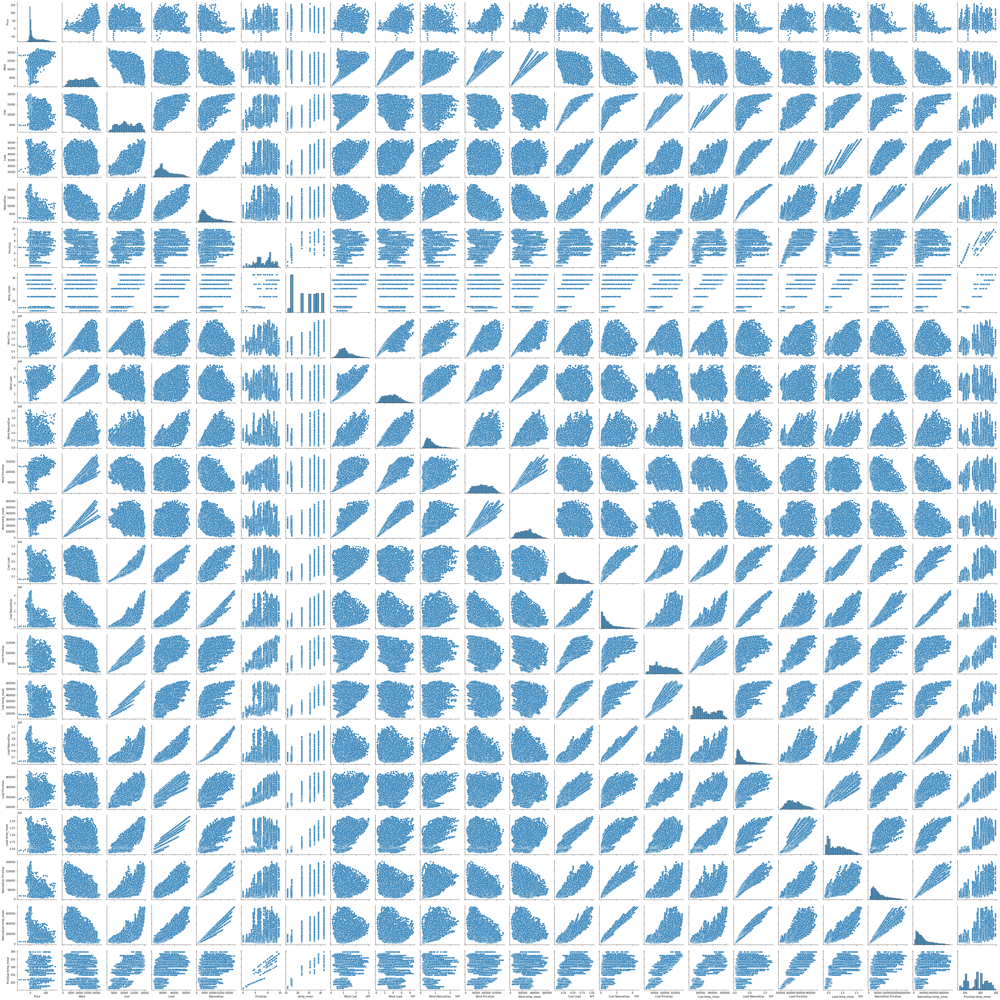

In [12]:
sns.pairplot(analis)

In [13]:
g=sns.pairplot(analis,
               y_vars=["Price"],
               kind="kde"
              )
g.fig.set_size_inches(25,25)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001535FC67DC0> (for post_execute):


KeyboardInterrupt: 

In [39]:
Data = data[["Data"]].copy()
price = data[["Price"]].copy()
params = data[["Wind", "Coal","Load","NaturalGas","PriceGaz","temp_mean"]].copy()

trans = PolynomialFeatures(degree=2, interaction_only= True)
paramsTransform = trans.fit_transform(params)
paramsPoly = pd.DataFrame(data=paramsTransform, columns=trans.get_feature_names(params.columns))
paramsPoly

c:\study\venv\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,1,Wind,Coal,Load,NaturalGas,PriceGaz,temp_mean,Wind Coal,Wind Load,Wind NaturalGas,...,Coal Load,Coal NaturalGas,Coal PriceGaz,Coal temp_mean,Load NaturalGas,Load PriceGaz,Load temp_mean,NaturalGas PriceGaz,NaturalGas temp_mean,PriceGaz temp_mean
0,1.0,11261.300,9906.600,27364.785,4318.000,5.43,17.0,1.115612e+08,3.081631e+08,4.862629e+07,...,2.710920e+08,4.277670e+07,53792.83800,168412.200,1.181611e+08,148590.78255,465201.345,23446.74000,73406.000,92.31
1,1.0,12656.000,9607.008,27144.399,2899.783,5.43,17.0,1.215863e+08,3.435395e+08,3.669965e+07,...,2.607765e+08,2.785824e+07,52166.05344,163319.136,7.871287e+07,147394.08657,461454.783,15745.82169,49296.311,92.31
2,1.0,13150.708,9300.617,27117.422,2830.575,5.43,17.0,1.223097e+08,3.566133e+08,3.722407e+07,...,2.522088e+08,2.632609e+07,50502.35031,158110.489,7.675790e+07,147247.60146,460996.174,15370.02225,48119.775,92.31
3,1.0,13862.425,8811.367,27297.655,2771.042,5.43,17.0,1.221469e+08,3.784117e+08,3.841336e+07,...,2.405297e+08,2.441667e+07,47845.72281,149793.239,7.564295e+07,148226.26665,464060.135,15046.75806,47107.714,92.31
4,1.0,14428.500,9045.167,27823.858,2950.642,5.43,17.0,1.305082e+08,4.014565e+08,4.257334e+07,...,2.516714e+08,2.668905e+07,49115.25681,153767.839,8.209824e+07,151083.54894,473005.586,16021.98606,50160.914,92.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,1.0,18579.892,3235.842,29452.850,6788.167,4.62,16.0,6.012159e+07,5.472308e+08,1.261234e+08,...,9.530477e+07,2.196544e+07,14949.59004,51773.472,1.999309e+08,136072.16700,471245.600,31361.33154,108610.672,73.92
5283,1.0,19330.683,3018.142,28559.588,5713.508,4.62,16.0,5.834275e+07,5.520763e+08,1.104460e+08,...,8.619689e+07,1.724418e+07,13943.81604,48290.272,1.631754e+08,131945.29656,456953.408,26396.40696,91416.128,73.92
5284,1.0,19511.817,2811.475,27382.076,4851.733,4.62,16.0,5.485699e+07,5.342741e+08,9.466613e+07,...,7.698402e+07,1.364053e+07,12989.01450,44983.600,1.328505e+08,126505.19112,438113.216,22415.00646,77627.728,73.92
5285,1.0,19282.625,2681.342,26143.921,4235.075,4.62,16.0,5.170331e+07,5.041234e+08,8.166336e+07,...,7.010079e+07,1.135568e+07,12387.80004,42901.472,1.107215e+08,120784.91502,418302.736,19566.04650,67761.200,73.92


In [7]:
selector = SelectKBest(score_func=mutual_info_regression, k='all')
fit  = selector.fit(paramsPoly, price)

cols = selector.get_support(indices=True)
# paramsPoly = paramsPoly.iloc[:,cols]
paramsPoly

c:\study\venv\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,1,Wind,Coal,Load,NaturalGas,PriceGaz,temp_mean,Wind Coal,Wind Load,Wind NaturalGas,...,Coal Load,Coal NaturalGas,Coal PriceGaz,Coal temp_mean,Load NaturalGas,Load PriceGaz,Load temp_mean,NaturalGas PriceGaz,NaturalGas temp_mean,PriceGaz temp_mean
0,1.0,11261.300,9906.600,27364.785,4318.000,5.43,16.975417,1.115612e+08,3.081631e+08,4.862629e+07,...,2.710920e+08,4.277670e+07,53792.83800,168168.662750,1.181611e+08,148590.78255,464528.627369,23446.74000,73299.849167,92.176512
1,1.0,12656.000,9607.008,27144.399,2899.783,5.43,16.975417,1.215863e+08,3.435395e+08,3.669965e+07,...,2.607765e+08,2.785824e+07,52166.05344,163082.963720,7.871287e+07,147394.08657,460787.483191,15745.82169,49225.024668,92.176512
2,1.0,13150.708,9300.617,27117.422,2830.575,5.43,16.975417,1.223097e+08,3.566133e+08,3.722407e+07,...,2.522088e+08,2.632609e+07,50502.35031,157881.848832,7.675790e+07,147247.60146,460329.537376,15370.02225,48050.190031,92.176512
3,1.0,13862.425,8811.367,27297.655,2771.042,5.43,16.975417,1.221469e+08,3.784117e+08,3.841336e+07,...,2.405297e+08,2.441667e+07,47845.72281,149576.626228,7.564295e+07,148226.26665,463389.067648,15046.75806,47039.592551,92.176512
4,1.0,14428.500,9045.167,27823.858,2950.642,5.43,16.975417,1.305082e+08,4.014565e+08,4.257334e+07,...,2.516714e+08,2.668905e+07,49115.25681,153545.478645,8.209824e+07,151083.54894,472321.582824,16021.98606,50088.377384,92.176512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,1.0,18579.892,3235.842,29452.850,6788.167,4.62,15.591083,6.012159e+07,5.472308e+08,1.261234e+08,...,9.530477e+07,2.196544e+07,14949.59004,50450.280558,1.999309e+08,136072.16700,459201.823121,31361.33154,105834.873775,72.030803
5283,1.0,19330.683,3018.142,28559.588,5713.508,4.62,15.591083,5.834275e+07,5.520763e+08,1.104460e+08,...,8.619689e+07,1.724418e+07,13943.81604,47056.101832,1.631754e+08,131945.29656,445274.901315,26396.40696,89079.776321,72.030803
5284,1.0,19511.817,2811.475,27382.076,4851.733,4.62,15.591083,5.485699e+07,5.342741e+08,9.466613e+07,...,7.698402e+07,1.364053e+07,12989.01450,43833.939522,1.328505e+08,126505.19112,426916.214222,22415.00646,75643.770939,72.030803
5285,1.0,19282.625,2681.342,26143.921,4235.075,4.62,15.591083,5.170331e+07,5.041234e+08,8.166336e+07,...,7.010079e+07,1.135568e+07,12387.80004,41805.025144,1.107215e+08,120784.91502,407612.037094,19566.04650,66029.405000,72.030803


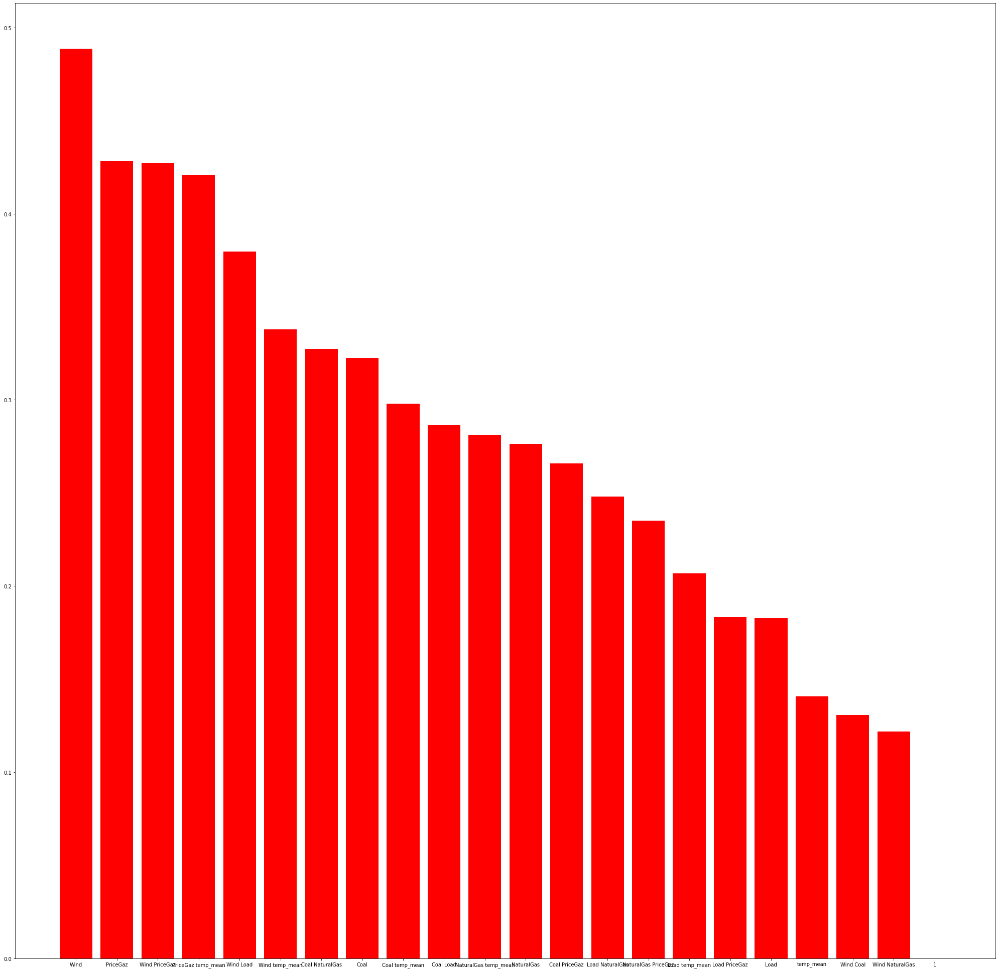

In [8]:
indices = np.argsort(fit.scores_)[::-1]
features = []
for i in range(len(indices)):
    features.append(paramsPoly.columns[indices[i]])

plt.figure(figsize=(35, 35))
plt.bar(features, fit.scores_[indices[range(len(indices))]], color='r', align='center')
plt.show()    

In [9]:
features

['Wind',
 'PriceGaz',
 'Wind PriceGaz',
 'PriceGaz temp_mean',
 'Wind Load',
 'Wind temp_mean',
 'Coal NaturalGas',
 'Coal',
 'Coal temp_mean',
 'Coal Load',
 'NaturalGas temp_mean',
 'NaturalGas',
 'Coal PriceGaz',
 'Load NaturalGas',
 'NaturalGas PriceGaz',
 'Load temp_mean',
 'Load PriceGaz',
 'Load',
 'temp_mean',
 'Wind Coal',
 'Wind NaturalGas',
 '1']

In [10]:
paramsPoly

,1,Wind,Coal,Load,NaturalGas,PriceGaz,temp_mean,Wind Coal,Wind Load,Wind NaturalGas,...,Coal Load,Coal NaturalGas,Coal PriceGaz,Coal temp_mean,Load NaturalGas,Load PriceGaz,Load temp_mean,NaturalGas PriceGaz,NaturalGas temp_mean,PriceGaz temp_mean
0,1.0,11261.300,9906.600,27364.785,4318.000,5.43,16.975417,1.115612e+08,3.081631e+08,4.862629e+07,...,2.710920e+08,4.277670e+07,53792.83800,168168.662750,1.181611e+08,148590.78255,464528.627369,23446.74000,73299.849167,92.176512
1,1.0,12656.000,9607.008,27144.399,2899.783,5.43,16.975417,1.215863e+08,3.435395e+08,3.669965e+07,...,2.607765e+08,2.785824e+07,52166.05344,163082.963720,7.871287e+07,147394.08657,460787.483191,15745.82169,49225.024668,92.176512
2,1.0,13150.708,9300.617,27117.422,2830.575,5.43,16.975417,1.223097e+08,3.566133e+08,3.722407e+07,...,2.522088e+08,2.632609e+07,50502.35031,157881.848832,7.675790e+07,147247.60146,460329.537376,15370.02225,48050.190031,92.176512
3,1.0,13862.425,8811.367,27297.655,2771.042,5.43,16.975417,1.221469e+08,3.784117e+08,3.841336e+07,...,2.405297e+08,2.441667e+07,47845.72281,149576.626228,7.564295e+07,148226.26665,463389.067648,15046.75806,47039.592551,92.176512
4,1.0,14428.500,9045.167,27823.858,2950.642,5.43,16.975417,1.305082e+08,4.014565e+08,4.257334e+07,...,2.516714e+08,2.668905e+07,49115.25681,153545.478645,8.209824e+07,151083.54894,472321.582824,16021.98606,50088.377384,92.176512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,1.0,18579.892,3235.842,29452.850,6788.167,4.62,15.591083,6.012159e+07,5.472308e+08,1.261234e+08,...,9.530477e+07,2.196544e+07,14949.59004,50450.280558,1.999309e+08,136072.16700,459201.823121,31361.33154,105834.873775,72.030803
5283,1.0,19330.683,3018.142,28559.588,5713.508,4.62,15.591083,5.834275e+07,5.520763e+08,1.104460e+08,...,8.619689e+07,1.724418e+07,13943.81604,47056.101832,1.631754e+08,131945.29656,445274.901315,26396.40696,89079.776321,72.030803
5284,1.0,19511.817,2811.475,27382.076,4851.733,4.62,15.591083,5.485699e+07,5.342741e+08,9.466613e+07,...,7.698402e+07,1.364053e+07,12989.01450,43833.939522,1.328505e+08,126505.19112,426916.214222,22415.00646,75643.770939,72.030803
5285,1.0,19282.625,2681.342,26143.921,4235.075,4.62,15.591083,5.170331e+07,5.041234e+08,8.166336e+07,...,7.010079e+07,1.135568e+07,12387.80004,41805.025144,1.107215e+08,120784.91502,407612.037094,19566.04650,66029.405000,72.030803


# Построгимм модель 

In [40]:
analis = pd.concat([Data, price, paramsPoly], axis=1).copy()

In [41]:
analis

,Data,Price,1,Wind,Coal,Load,NaturalGas,PriceGaz,temp_mean,Wind Coal,...,Coal Load,Coal NaturalGas,Coal PriceGaz,Coal temp_mean,Load NaturalGas,Load PriceGaz,Load temp_mean,NaturalGas PriceGaz,NaturalGas temp_mean,PriceGaz temp_mean
0,2022-04-01 00:00:00,1.1016,1.0,11261.300,9906.600,27364.785,4318.000,5.43,17.0,1.115612e+08,...,2.710920e+08,4.277670e+07,53792.83800,168412.200,1.181611e+08,148590.78255,465201.345,23446.74000,73406.000,92.31
1,2022-04-01 01:00:00,1.9007,1.0,12656.000,9607.008,27144.399,2899.783,5.43,17.0,1.215863e+08,...,2.607765e+08,2.785824e+07,52166.05344,163319.136,7.871287e+07,147394.08657,461454.783,15745.82169,49296.311,92.31
2,2022-04-01 02:00:00,3.8994,1.0,13150.708,9300.617,27117.422,2830.575,5.43,17.0,1.223097e+08,...,2.522088e+08,2.632609e+07,50502.35031,158110.489,7.675790e+07,147247.60146,460996.174,15370.02225,48119.775,92.31
3,2022-04-01 03:00:00,2.9296,1.0,13862.425,8811.367,27297.655,2771.042,5.43,17.0,1.221469e+08,...,2.405297e+08,2.441667e+07,47845.72281,149793.239,7.564295e+07,148226.26665,464060.135,15046.75806,47107.714,92.31
4,2022-04-01 04:00:00,2.3903,1.0,14428.500,9045.167,27823.858,2950.642,5.43,17.0,1.305082e+08,...,2.516714e+08,2.668905e+07,49115.25681,153767.839,8.209824e+07,151083.54894,473005.586,16021.98606,50160.914,92.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,2022-11-07 20:00:00,12.0815,1.0,18579.892,3235.842,29452.850,6788.167,4.62,16.0,6.012159e+07,...,9.530477e+07,2.196544e+07,14949.59004,51773.472,1.999309e+08,136072.16700,471245.600,31361.33154,108610.672,73.92
5283,2022-11-07 21:00:00,20.8286,1.0,19330.683,3018.142,28559.588,5713.508,4.62,16.0,5.834275e+07,...,8.619689e+07,1.724418e+07,13943.81604,48290.272,1.631754e+08,131945.29656,456953.408,26396.40696,91416.128,73.92
5284,2022-11-07 22:00:00,23.8164,1.0,19511.817,2811.475,27382.076,4851.733,4.62,16.0,5.485699e+07,...,7.698402e+07,1.364053e+07,12989.01450,44983.600,1.328505e+08,126505.19112,438113.216,22415.00646,77627.728,73.92
5285,2022-11-07 23:00:00,18.5490,1.0,19282.625,2681.342,26143.921,4235.075,4.62,16.0,5.170331e+07,...,7.010079e+07,1.135568e+07,12387.80004,42901.472,1.107215e+08,120784.91502,418302.736,19566.04650,67761.200,73.92


In [42]:
x = datetime.datetime(2020, 1, 1)
y = datetime.datetime(2022, 8, 10)
z = datetime.datetime(2022, 10, 10)

dataTrain = analis[(analis['Data'] >= x) & (analis['Data'] < y) ].copy()
dataPred = analis[(analis['Data'] >= y) & (analis['Data'] < z)].copy()

# scalerFeat = StandardScaler()
# scalerPrice = StandardScaler()

y_train = dataTrain['Price'].copy()
X_train = dataTrain.drop(["Data", 'Price', '1'], axis=1).copy()

y_test = dataPred['Price'].copy()
X_test = dataPred.drop(["Data", 'Price',  '1'], axis=1).copy()

# X_train = scalerFeat.fit_transform(X_train)
# X_test = scalerFeat.transform(X_test)   

# y_train = scalerPrice.fit_transform(y_train.to_numpy().reshape(-1, 1))
# y_test = scalerPrice.transform(y_test.to_numpy().reshape(-1, 1))

In [43]:
y_test

3138   -0.1300
3139    1.2500
3140    1.5000
3141    1.3800
3142    0.8100
         ...  
4597   -0.6985
4598   -0.8084
4599   -0.2709
4600    0.0739
4601   -0.0728
Name: Price, Length: 1464, dtype: float64

In [44]:
reg = LinearRegression(fit_intercept=True).fit(X_train, y_train)
y_pred = reg.predict(X_test)
y_pred

array([ 7.28138419,  8.65724837, 12.214711  , ...,  2.47273324,
       -1.74470927, -2.83306871])

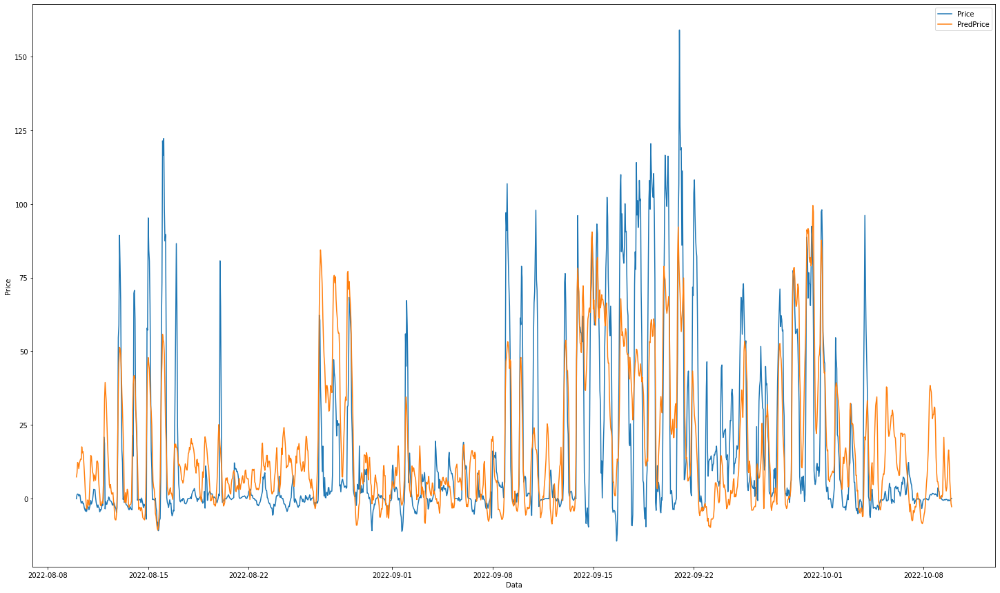

In [45]:

price = pd.DataFrame()
price["Price"] =y_test
price["PredPrice"] = y_pred

# price["diff"] =  (price['pred'] - oosDF['y']).abs()
price.index = dataPred["Data"]



plt.rcParams['figure.figsize'] = (25,15)
sns.lineplot(data=price, x='Data', y='Price', label="Price")
sns.lineplot(data=price, x='Data', y='PredPrice', label="PredPrice")

# plt.ylim(0, 10)
plt.show()


In [46]:
from sklearn.svm import SVR
model = SVR(kernel='rbf', C=12, epsilon=1).fit(X_train, y_train)

y_svd = reg.predict(X_test)
y_svd

array([ 7.28138419,  8.65724837, 12.214711  , ...,  2.47273324,
       -1.74470927, -2.83306871])

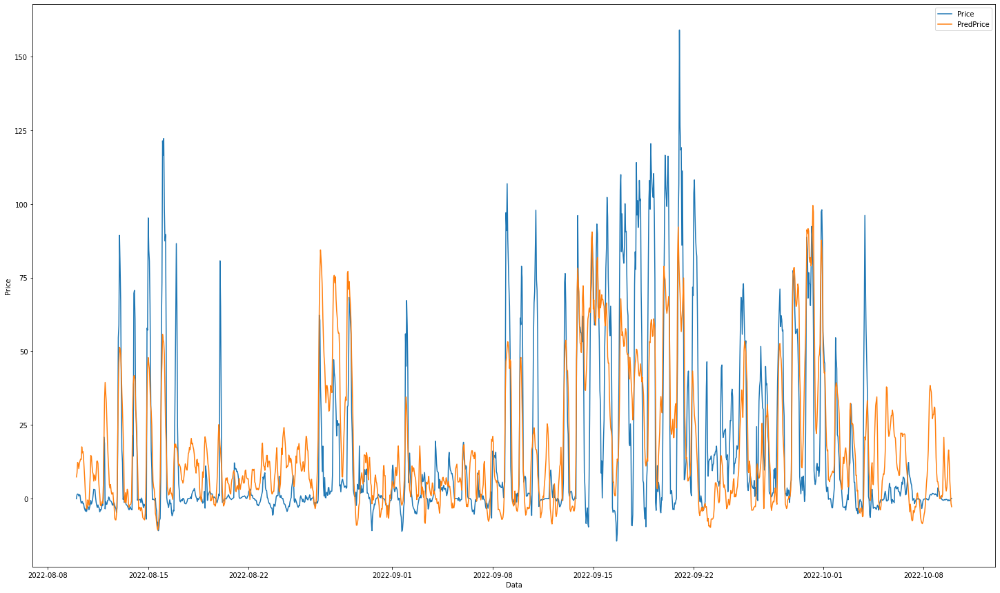

In [48]:

price = pd.DataFrame()
price["Price"] =y_test
price["PredPrice"] = y_svd

# price["diff"] =  (price['pred'] - oosDF['y']).abs()
price.index = dataPred["Data"]



plt.rcParams['figure.figsize'] = (25,15)
sns.lineplot(data=price, x='Data', y='Price', label="Price")
sns.lineplot(data=price, x='Data', y='PredPrice', label="PredPrice")

# plt.ylim(0, 10)
plt.show()

# Построгимм модель 

In [124]:
analis = pd.concat([Data, price, paramsPoly], axis=1).copy()

In [125]:
analis

,Data,Price,1,Wind,Coal,Load,NaturalGas,PriceGaz,temp_mean,Wind Coal,...,Coal Load,Coal NaturalGas,Coal PriceGaz,Coal temp_mean,Load NaturalGas,Load PriceGaz,Load temp_mean,NaturalGas PriceGaz,NaturalGas temp_mean,PriceGaz temp_mean
0,2022-04-01 00:00:00,1.1016,1.0,11261.300,9906.600,27364.785,4318.000,5.43,16.975417,1.115612e+08,...,2.710920e+08,4.277670e+07,53792.83800,168168.662750,1.181611e+08,148590.78255,464528.627369,23446.74000,73299.849167,92.176512
1,2022-04-01 01:00:00,1.9007,1.0,12656.000,9607.008,27144.399,2899.783,5.43,16.975417,1.215863e+08,...,2.607765e+08,2.785824e+07,52166.05344,163082.963720,7.871287e+07,147394.08657,460787.483191,15745.82169,49225.024668,92.176512
2,2022-04-01 02:00:00,3.8994,1.0,13150.708,9300.617,27117.422,2830.575,5.43,16.975417,1.223097e+08,...,2.522088e+08,2.632609e+07,50502.35031,157881.848832,7.675790e+07,147247.60146,460329.537376,15370.02225,48050.190031,92.176512
3,2022-04-01 03:00:00,2.9296,1.0,13862.425,8811.367,27297.655,2771.042,5.43,16.975417,1.221469e+08,...,2.405297e+08,2.441667e+07,47845.72281,149576.626228,7.564295e+07,148226.26665,463389.067648,15046.75806,47039.592551,92.176512
4,2022-04-01 04:00:00,2.3903,1.0,14428.500,9045.167,27823.858,2950.642,5.43,16.975417,1.305082e+08,...,2.516714e+08,2.668905e+07,49115.25681,153545.478645,8.209824e+07,151083.54894,472321.582824,16021.98606,50088.377384,92.176512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5282,2022-11-07 20:00:00,12.0815,1.0,18579.892,3235.842,29452.850,6788.167,4.62,15.591083,6.012159e+07,...,9.530477e+07,2.196544e+07,14949.59004,50450.280558,1.999309e+08,136072.16700,459201.823121,31361.33154,105834.873775,72.030803
5283,2022-11-07 21:00:00,20.8286,1.0,19330.683,3018.142,28559.588,5713.508,4.62,15.591083,5.834275e+07,...,8.619689e+07,1.724418e+07,13943.81604,47056.101832,1.631754e+08,131945.29656,445274.901315,26396.40696,89079.776321,72.030803
5284,2022-11-07 22:00:00,23.8164,1.0,19511.817,2811.475,27382.076,4851.733,4.62,15.591083,5.485699e+07,...,7.698402e+07,1.364053e+07,12989.01450,43833.939522,1.328505e+08,126505.19112,426916.214222,22415.00646,75643.770939,72.030803
5285,2022-11-07 23:00:00,18.5490,1.0,19282.625,2681.342,26143.921,4235.075,4.62,15.591083,5.170331e+07,...,7.010079e+07,1.135568e+07,12387.80004,41805.025144,1.107215e+08,120784.91502,407612.037094,19566.04650,66029.405000,72.030803


In [129]:
x = datetime.datetime(2020, 1, 1)
y = datetime.datetime(2022, 8, 10)
z = datetime.datetime(2022, 9, 10)

dataTrain = analis[(analis['Data'] >= x) & (analis['Data'] < y) ].copy()
dataPred = analis[(analis['Data'] >= y) & (analis['Data'] < z)].copy()

# scalerFeat = StandardScaler()
# scalerPrice = StandardScaler()

y_train = dataTrain['Price'].copy()
X_train = dataTrain.drop(["Data", 'Price', '1'], axis=1).copy()

y_test = dataPred['Price'].copy()
X_test = dataPred.drop(["Data", 'Price',  '1'], axis=1).copy()

# X_train = scalerFeat.fit_transform(X_train)
# X_test = scalerFeat.transform(X_test)   

# y_train = scalerPrice.fit_transform(y_train.to_numpy().reshape(-1, 1))
# y_test = scalerPrice.transform(y_test.to_numpy().reshape(-1, 1))

In [133]:
y_train

0       1.1016
1       1.9007
2       3.8994
3       2.9296
4       2.3903
         ...  
3133   -2.3600
3134   -2.6900
3135   -0.0900
3136    1.0000
3137    1.3200
Name: Price, Length: 3138, dtype: float64

In [131]:
reg = LinearRegression(fit_intercept=True).fit(X_train, y_train)
y_pred = reg.predict(X_test)

In [145]:

price = pd.DataFrame()
price["Price"] =y_test
price["PredPrice"] = y_pred

price["diff"] =  (price['pred'] - oosDF['y']).abs()
price.index = dataPred["Data"]



price


,Price,PredPrice
Data,,
2022-08-10 00:00:00,-0.1300,7.645811
2022-08-10 01:00:00,1.2500,8.957547
2022-08-10 02:00:00,1.5000,12.519806
2022-08-10 03:00:00,1.3800,11.747541
2022-08-10 04:00:00,0.8100,10.136426
...,...,...
2022-09-09 19:00:00,1.8251,-0.699708
2022-09-09 20:00:00,4.7405,11.131094
2022-09-09 21:00:00,39.0695,34.726874


In [26]:
column = ["Data", "Price","Load", "Wind", "Coal", "NaturalGas",   "temp_mean", "prcp_mean", ]
dataTMP = data[column]
dataTMP


,Data,Price,Load,Wind,Coal,NaturalGas,temp_mean,prcp_mean
0,2022-04-01 00:00:00,1.1016,27364.785,11261.300,9906.600,4318.000,16.975417,0.058750
1,2022-04-01 01:00:00,1.9007,27144.399,12656.000,9607.008,2899.783,16.975417,0.058750
2,2022-04-01 02:00:00,3.8994,27117.422,13150.708,9300.617,2830.575,16.975417,0.058750
3,2022-04-01 03:00:00,2.9296,27297.655,13862.425,8811.367,2771.042,16.975417,0.058750
4,2022-04-01 04:00:00,2.3903,27823.858,14428.500,9045.167,2950.642,16.975417,0.058750
...,...,...,...,...,...,...,...,...
5282,2022-11-07 20:00:00,12.0815,29452.850,18579.892,3235.842,6788.167,15.591083,0.292994
5283,2022-11-07 21:00:00,20.8286,28559.588,19330.683,3018.142,5713.508,15.591083,0.292994
5284,2022-11-07 22:00:00,23.8164,27382.076,19511.817,2811.475,4851.733,15.591083,0.292994
5285,2022-11-07 23:00:00,18.5490,26143.921,19282.625,2681.342,4235.075,15.591083,0.292994


In [43]:
# Выбор признаков
x = datetime.datetime(2020, 1, 1)
y = datetime.datetime(2022, 8, 10)
z = datetime.datetime(2022, 9, 10)


dataTrain = dataTMP[(dataTMP['Data'] >= x) & (dataTMP['Data'] < y) ].copy()
dataPred = dataTMP[(dataTMP['Data'] >= y) & (dataTMP['Data'] < z)].copy()

scalerFeat = StandardScaler()
scalerPrice = StandardScaler()

y_train = dataTrain['Price'].copy()
X_train = dataTrain.drop(["Data", 'Price'], axis=1).copy()

y_test = dataPred['Price'].copy()
X_test = dataPred.drop(["Data", 'Price'], axis=1).copy()

X_train = scalerFeat.fit_transform(X_train)
X_test = scalerFeat.transform(X_test)   

y_train = scalerPrice.fit_transform(y_train.to_numpy().reshape(-1, 1))
y_test = scalerPrice.transform(y_test.to_numpy().reshape(-1, 1))


In [53]:
dataPred.drop(["Data", 'Price'], axis=1).copy()

,Load,Wind,Coal,NaturalGas,temp_mean,prcp_mean
3138,33864.221,6021.308,17815.600,8271.808,29.065323,0.052688
3139,32457.982,5378.292,17638.250,7658.975,29.065323,0.052688
3140,31485.518,4575.908,17810.925,7355.008,29.065323,0.052688
3141,30922.492,4000.900,17585.275,7154.325,29.065323,0.052688
3142,30774.841,3908.475,17411.092,7021.592,29.065323,0.052688
...,...,...,...,...,...,...
3877,38134.099,8749.550,15610.417,11261.742,25.362778,0.004583
3878,36601.151,11769.725,14130.508,8024.242,25.362778,0.004583
3879,34710.074,14688.500,11731.808,6058.167,25.362778,0.004583
3880,32810.216,16049.092,10278.442,5520.242,25.362778,0.004583


In [52]:
X_train

,Load,Wind,Coal,NaturalGas,temp_mean,prcp_mean
0,27364.785,11261.300,9906.600,4318.000,16.975417,0.058750
1,27144.399,12656.000,9607.008,2899.783,16.975417,0.058750
2,27117.422,13150.708,9300.617,2830.575,16.975417,0.058750
3,27297.655,13862.425,8811.367,2771.042,16.975417,0.058750
4,27823.858,14428.500,9045.167,2950.642,16.975417,0.058750
...,...,...,...,...,...,...
3133,43837.643,7120.700,19070.117,16277.150,29.065323,0.052688
3134,42157.691,6937.542,19154.567,14929.025,29.065323,0.052688
3135,40464.457,7178.813,18883.575,12881.700,29.065323,0.052688
3136,38250.354,6906.260,18413.820,11431.840,29.065323,0.052688


# Регрессия

In [46]:
reg = LinearRegression(fit_intercept=True).fit(X_train, y_train)
y_pred = reg.predict(X_test)

mean_absolute_percentage_error 1666216802525405.0
None


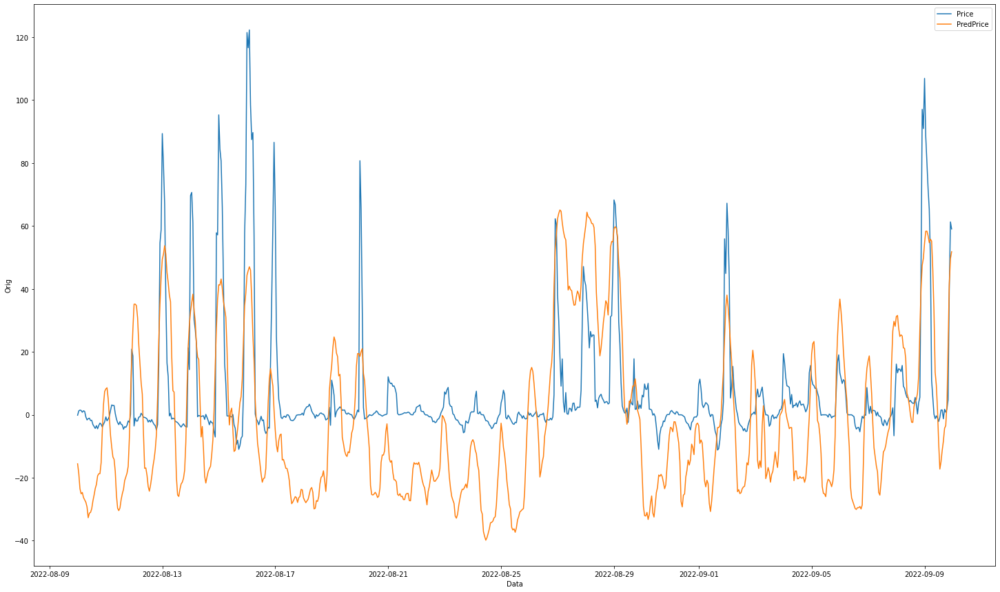

In [47]:
priceTest = pd.DataFrame(y_test, columns = ["Price"])
PredPrice = pd.DataFrame(y_pred, columns = ["PredPrice"])

price = pd.DataFrame()
price["Price"] = priceTest["Price"]
price["PredPrice"] = PredPrice["PredPrice"]
price.index = dataPred["Data"]

price["Orig"] = scalerPrice.inverse_transform(price["Price"].values.reshape(-1, 1))
price["Pred"]= scalerPrice.inverse_transform(price["PredPrice"].values.reshape(-1, 1))

print(print("mean_absolute_percentage_error", mean_absolute_percentage_error(price["Orig"].values, price["Pred"].values)))

plt.rcParams['figure.figsize'] = (25,15)
sns.lineplot(data=price, x='Data', y='Orig', label="Price")
sns.lineplot(data=price, x='Data', y='Pred', label="PredPrice")

# plt.ylim(0, 10)
plt.show()

In [62]:
# evaluation of a model using 10 features chosen with correlation
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
 
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select a subset of features
	fs = SelectKBest(score_func=f_regression, k=65)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# load the dataset
X, y = make_regression(n_samples=1000, n_features=100, n_informative=10, noise=0.1, random_state=1)
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model = LinearRegression()
model.fit(X_train_fs, y_train)
# evaluate the model
yhat = model.predict(X_test_fs)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

MAE: 2.936


In [65]:
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select a subset of features
	fs = SelectKBest(score_func=f_regression, k=85)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# load the dataset
X, y = make_regression(n_samples=1000, n_features=100, n_informative=10, noise=0.1, random_state=1)
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model = LinearRegression()
model.fit(X_train_fs, y_train)
# evaluate the model
yhat = model.predict(X_test_fs)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

MAE: 0.085


In [66]:
from sklearn.datasets import make_regression
from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
# define dataset
X, y = make_regression(n_samples=1000, n_features=100, n_informative=10, noise=0.1, random_state=1)
# define the evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define the pipeline to evaluate
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])
# define the grid
grid = dict()
grid['sel__k'] = [i for i in range(X.shape[1]-20, X.shape[1]+1)]
# define the grid search
search = GridSearchCV(pipeline, grid, scoring='neg_mean_squared_error', n_jobs=-1, cv=cv)
# perform the search
results = search.fit(X, y)
# summarize best
print('Best MAE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best MAE: -0.010
Best Config: {'sel__k': 81}
>-50.101 with: {'sel__k': 80}
>-0.010 with: {'sel__k': 81}
>-0.010 with: {'sel__k': 82}
>-0.010 with: {'sel__k': 83}
>-0.010 with: {'sel__k': 84}
>-0.010 with: {'sel__k': 85}
>-0.010 with: {'sel__k': 86}
>-0.010 with: {'sel__k': 87}
>-0.010 with: {'sel__k': 88}
>-0.010 with: {'sel__k': 89}
>-0.010 with: {'sel__k': 90}
>-0.011 with: {'sel__k': 91}
>-0.011 with: {'sel__k': 92}
>-0.011 with: {'sel__k': 93}
>-0.011 with: {'sel__k': 94}
>-0.011 with: {'sel__k': 95}
>-0.011 with: {'sel__k': 96}
>-0.011 with: {'sel__k': 97}
>-0.011 with: {'sel__k': 98}
>-0.011 with: {'sel__k': 99}
>-0.011 with: {'sel__k': 100}
